In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from diffdrr.drr import DRR
from pytorch3d.transforms import standardize_quaternion
from tqdm import tqdm

from diffpose.deepfluoro import DeepFluoroDataset, Transforms
from diffpose.visualization import overlay_edges

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class Simulator(torch.nn.Module):
    def __init__(self, id_number, bone_attenuation_multiplier=None):
        super().__init__()
        self.specimen = DeepFluoroDataset(id_number)
        self.drr = self.setup_diffdrr(self.specimen, bone_attenuation_multiplier)
        self.transforms = Transforms(size=self.drr.detector.height)

    def __len__(self):
        return len(self.specimen)

    def setup_diffdrr(self, specimen, bone_attenuation_multiplier):
        subsample = 4
        height = (1536 - 100) // subsample
        dx = 0.194 * subsample
        sdr = specimen.focal_len / 2
        return DRR(
            specimen.volume,
            specimen.spacing,
            sdr=sdr,
            height=height,
            delx=dx,
            x0=specimen.x0,
            y0=specimen.y0,
            reverse_x_axis=True,
            bone_attenuation_multiplier=bone_attenuation_multiplier,
        ).to(device)

    def forward(self, idx, sigma):
        true_xray, pose = self.specimen[idx]
        pred_xray = self.drr(None, None, None, pose=pose.to(device))
        true_xray = self.transforms(true_xray)
        pred_xray = self.transforms(pred_xray)
        return overlay_edges(true_xray, pred_xray, sigma)

## Visualize camera poses

Parameterizing rotations as quaternions provides the smoothest representations of camera poses,
however distributions are very different across subjects.

In [ ]:
import pandas as pd
import seaborn as sns

from diffdrr.utils import convert

In [ ]:
def read_params(specimen_id):
    simulator = Simulator(specimen_id)
    parameters = []
    for _, pose in tqdm(simulator.specimen, ncols=75):
        rotation = convert(pose.get_rotation(), "matrix", "quaternion")
        rotation = standardize_quaternion(rotation)
        translation = pose.get_translation()
        parameters.append(rotation.flatten().tolist() + translation.flatten().tolist())
    df = pd.DataFrame(parameters, columns=["qr", "qi", "qj", "qk", "bx", "by", "bz"])
    df["specimen_id"] = f"{specimen_id}"
    return df

In [ ]:
dfs = [read_params(idx) for idx in range(1, 7)]
df = pd.concat(dfs).reset_index(drop=True)
df.head()

100%|██████████████████████████████████████| 24/24 [00:02<00:00,  9.65it/s]


,qr,qi,qj,qk,bx,by,bz,specimen_id
0,0.526532,-0.472271,-0.490813,0.508750,191.273315,332.638611,165.694885,1
1,0.525989,-0.471070,-0.491968,0.509309,190.584625,380.110413,167.100708,1
2,0.636865,-0.588132,-0.336718,0.367593,228.617737,285.662231,159.831787,1
3,0.664899,-0.590688,-0.292922,0.350989,268.551392,319.972107,103.838623,1
4,0.636763,-0.588241,-0.336784,0.367535,225.662567,287.129517,127.286865,1


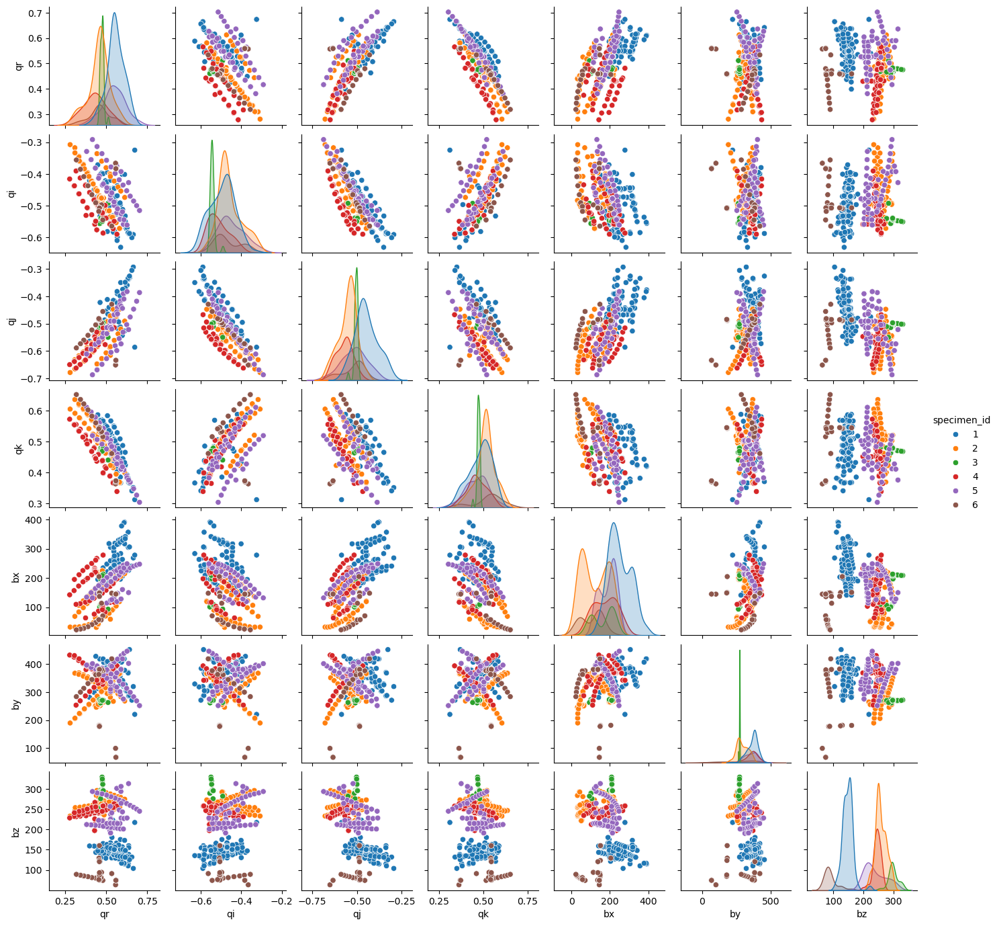

In [ ]:
sns.pairplot(df, hue="specimen_id", height=2.0)
plt.show()

## Logmap

We can also visualize the camera poses in the tangent plane to SE(3). 
We specifically visualize offsets from the specimen's isocenter.

In [ ]:
dfs = []
for id_number in range(1, 7):
    specimen = DeepFluoroDataset(id_number)
    logs = []
    for _, pose in tqdm(specimen, ncols=75):
        offset = specimen.isocenter_pose.inverse().compose(pose)
        logs.append(offset.get_se3_log().squeeze().tolist())
    df = pd.DataFrame(logs, columns=["r1", "r2", "r3", "t1", "t2", "t3"])
    df["specimen"] = id_number
    dfs.append(df)

df = pd.concat(dfs)
df["specimen"] = df["specimen"].astype("category")
df.head()

100%|██████████████████████████████████████| 24/24 [00:02<00:00,  9.74it/s]


,r1,r2,r3,t1,t2,t3,specimen
0,0.036333,0.072215,0.000760,-19.647938,240.070465,1.458560,1
1,0.037587,0.072278,0.004219,-19.539360,287.097900,1.694475,1
2,0.018072,0.080559,-0.526908,-85.570374,298.490448,2.401929,1
3,0.016420,0.134538,-0.622133,-81.341881,362.447906,-40.157444,1
4,0.017985,0.080220,-0.526906,-87.454056,298.952148,-30.311920,1


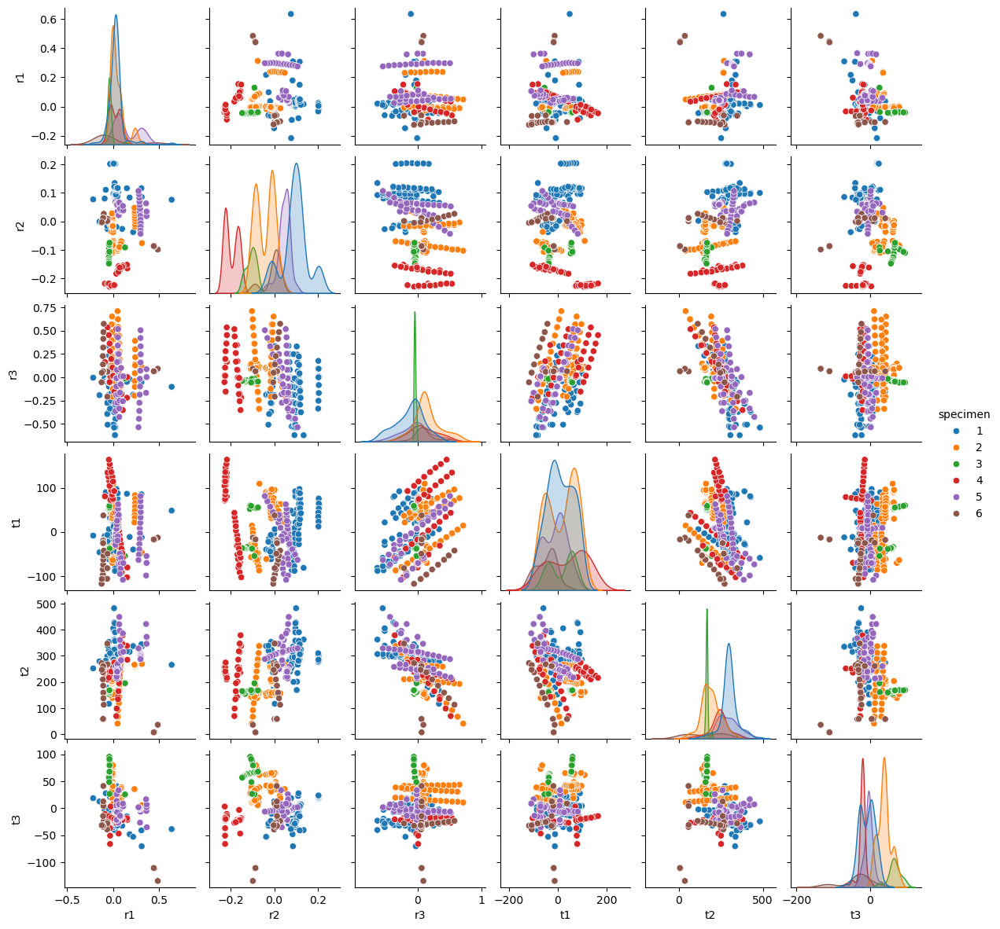

In [ ]:
sns.pairplot(df, hue="specimen", height=2.0)
plt.show()

In [ ]:
df.describe()

,r1,r2,r3,t1,t2,t3
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,0.042246,-0.010383,0.021493,8.183658,241.613094,6.928242
std,0.109843,0.105303,0.236635,60.339255,79.636910,34.754194
min,-0.216699,-0.228263,-0.622133,-117.581871,6.971102,-134.236725
25%,-0.011940,-0.086218,-0.076451,-41.221780,169.136051,-20.429067
50%,0.023854,-0.001267,0.005391,7.023252,251.910316,4.422227
75%,0.060591,0.072262,0.134018,58.992722,297.788193,34.407932
max,0.634592,0.206258,0.711423,163.980026,482.579834,95.244934


## Plot X-rays and DRRs from the computed pose

In [ ]:
from torchvision.utils import make_grid

### Specimen 1

100%|████████████████████████████████████| 111/111 [01:05<00:00,  1.68it/s]


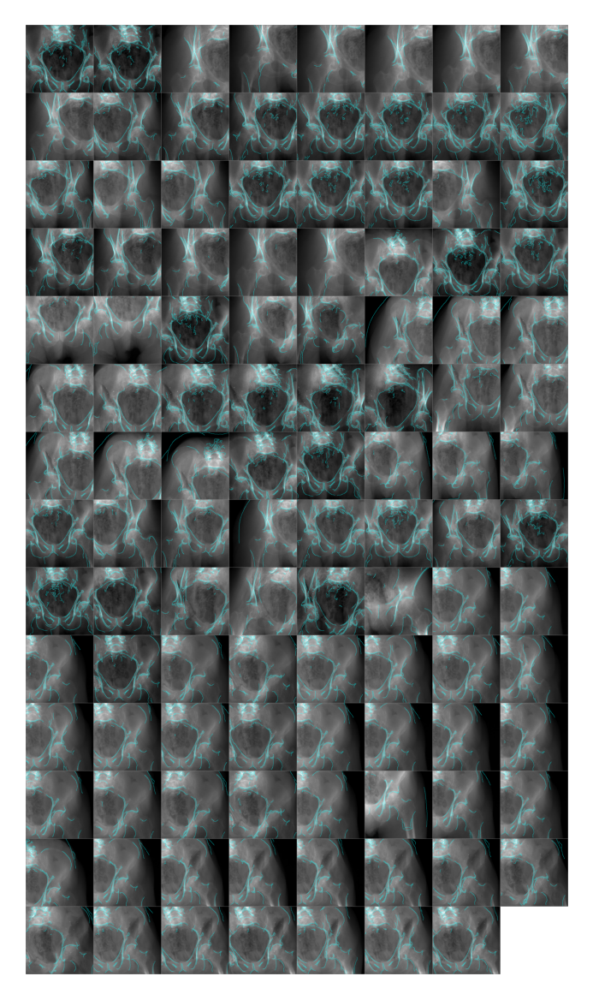

In [ ]:
simulator = Simulator(1, bone_attenuation_multiplier=2.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()

### Specimen 2

100%|████████████████████████████████████| 104/104 [01:00<00:00,  1.73it/s]


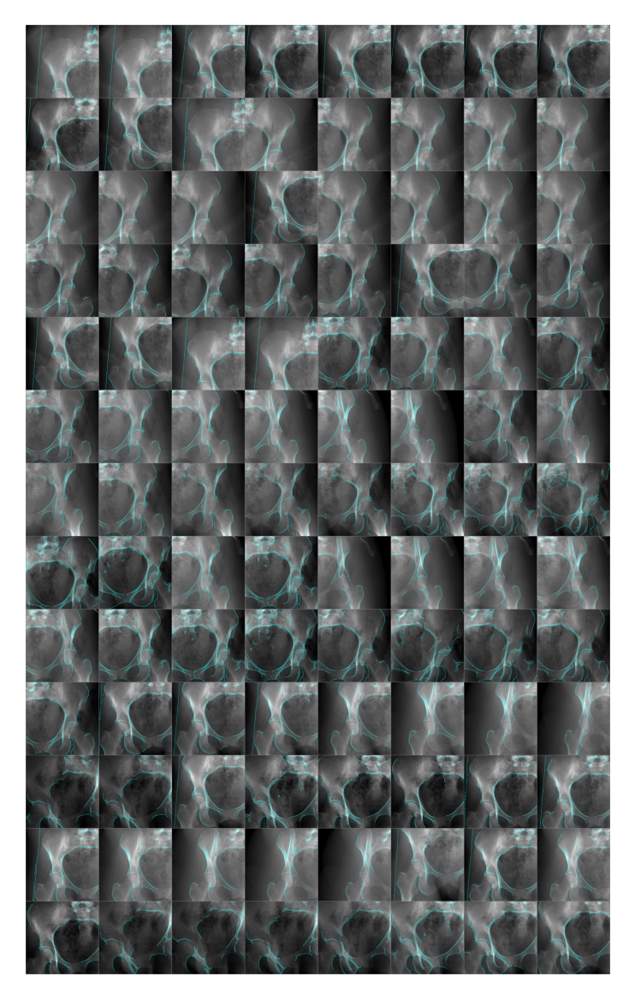

In [ ]:
simulator = Simulator(2, bone_attenuation_multiplier=2.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()

### Specimen 3

100%|██████████████████████████████████████| 24/24 [00:14<00:00,  1.63it/s]


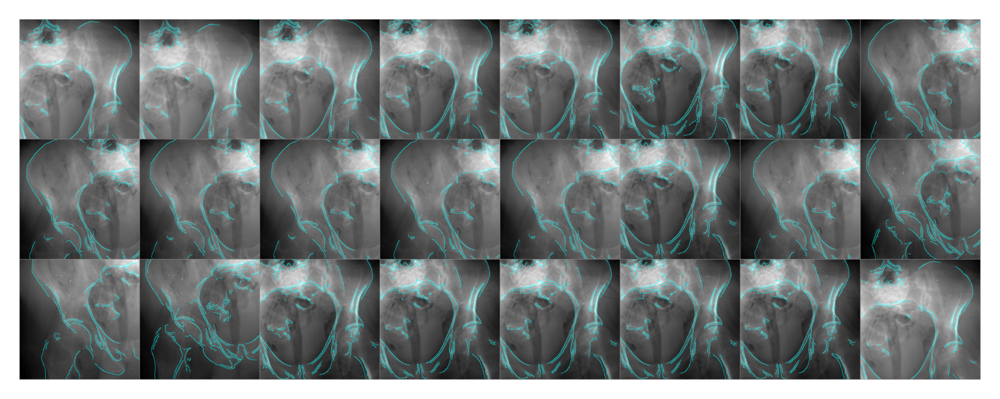

In [ ]:
simulator = Simulator(3, bone_attenuation_multiplier=3.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()

### Specimen 4

100%|██████████████████████████████████████| 48/48 [00:29<00:00,  1.64it/s]


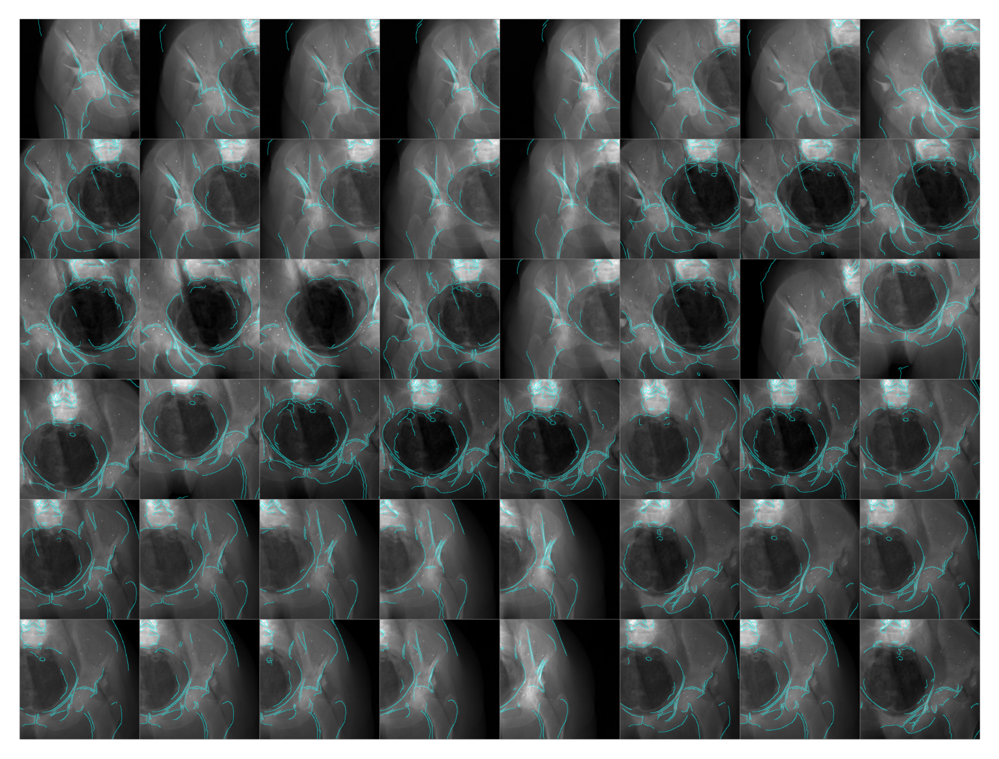

In [ ]:
simulator = Simulator(4, bone_attenuation_multiplier=2.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()

### Specimen 5

100%|██████████████████████████████████████| 55/55 [00:32<00:00,  1.67it/s]


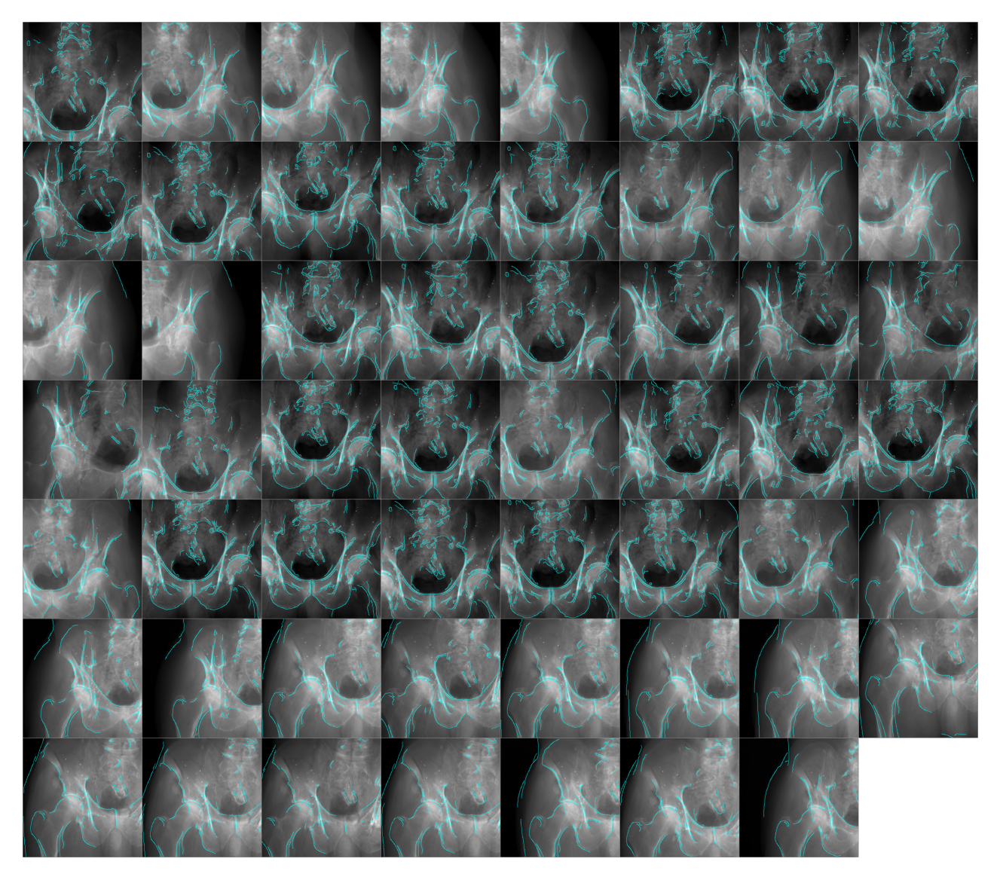

In [ ]:
simulator = Simulator(5, bone_attenuation_multiplier=2.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()

### Specimen 6

100%|██████████████████████████████████████| 24/24 [00:14<00:00,  1.68it/s]


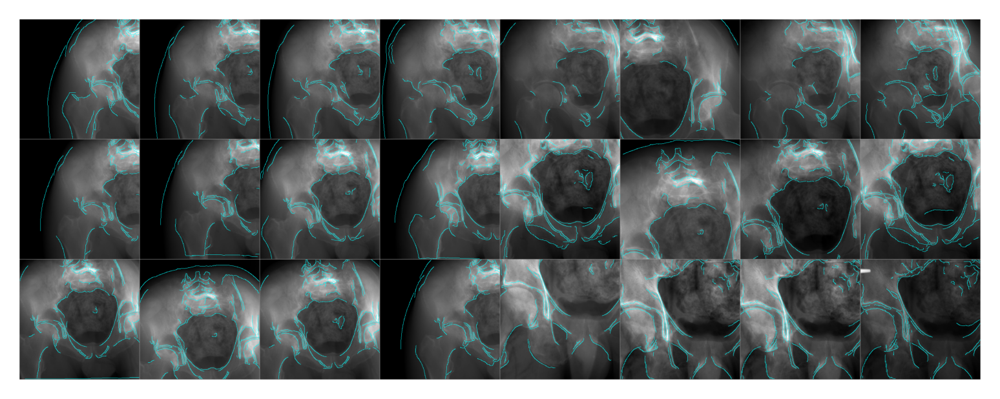

In [ ]:
simulator = Simulator(6, bone_attenuation_multiplier=2.0)
edges = [simulator(idx, sigma=1.0) for idx in tqdm(range(len(simulator)), ncols=75)]

plt.figure(dpi=300)
plt.imshow(make_grid(torch.stack(edges).permute(0, -1, 1, 2)).permute(1, 2, 0))
plt.axis("off")
plt.show()